In [3]:
import time
from math import floor
from os.path import join
from random import randint

import cv2 as cv
import matplotlib.patches as patches
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import torch
from PIL import Image
from sklearn.utils import shuffle

## Парсим аннотации к кадрам

In [4]:
MOT2001_TRAIN_PATH = join('..', 'data', 'MOT20', 'train', 'MOT20-01')

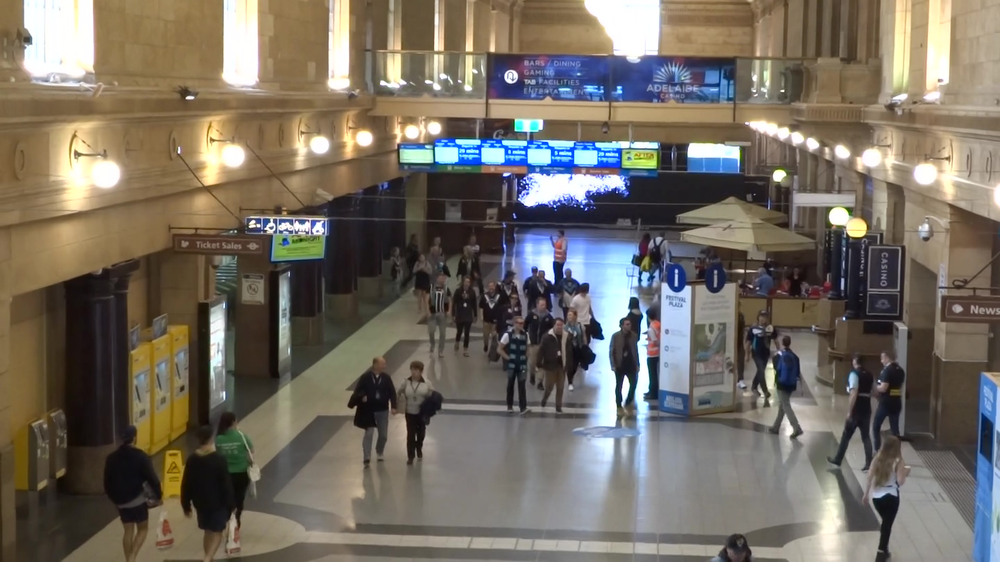

In [6]:
def get_image_path_by_frame_id(frame_id):
    return join(MOT2001_TRAIN_PATH, 'img1', f'{int(frame_id):06}.jpg')
raw_img = Image.open(get_image_path_by_frame_id(1))
raw_img

In [4]:
def get_data_annotations(dataset_path_prefix):
  annotations = None
  with open(join(dataset_path_prefix, 'gt', 'gt.txt')) as f:
      annotations = pd.DataFrame(
          list(
              map(lambda l: np.array(
                  list(
                      map(lambda x: float(x), l.split(',')))), f.readlines()))
      )
      annotations.columns = ['frame', 'id', 'bb_left', 'bb_top',
                             'bb_width', 'bb_height', 'flag?', 'class', 'conf']
      annotations.astype({
          'frame': int,
          'id': int,
          'bb_left': float, 
          'bb_top': float,
          'bb_width': float,
            'bb_height': float,
              'flag?': int,
                'class': int,
                  'conf': float
      })
  
  return annotations

annotations = get_data_annotations(MOT2001_TRAIN_PATH)
annotations

,frame,id,bb_left,bb_top,bb_width,bb_height,flag?,class,conf
0,1.0,1.0,199.0,813.0,140.0,268.0,1.0,1.0,0.83643
1,2.0,1.0,201.0,812.0,140.0,268.0,1.0,1.0,0.84015
2,3.0,1.0,203.0,812.0,140.0,268.0,1.0,1.0,0.84015
3,4.0,1.0,206.0,812.0,140.0,268.0,1.0,1.0,0.84015
4,5.0,1.0,208.0,812.0,140.0,268.0,1.0,1.0,0.84015
...,...,...,...,...,...,...,...,...,...
26642,425.0,90.0,4.0,1.0,500.0,813.0,0.0,11.0,1.00000
26643,426.0,90.0,4.0,1.0,501.0,812.0,0.0,11.0,1.00000
26644,427.0,90.0,4.0,1.0,502.0,812.0,0.0,11.0,1.00000
26645,428.0,90.0,4.0,1.0,503.0,811.0,0.0,11.0,1.00000


## Отрисовываем людей с их хитбоксом

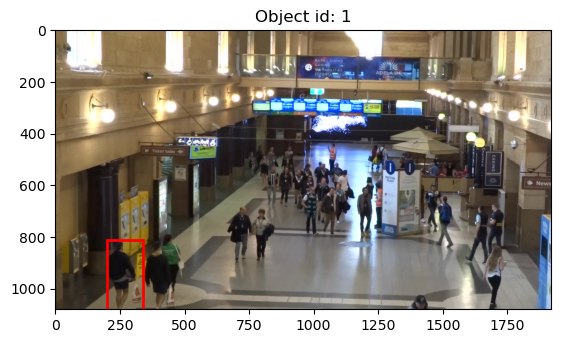

In [5]:
def show_object_with_bb(image, object_params):
    x, y, w, h = object_params[2:6].astype(int)
    _, ax = plt.subplots()
    ax.imshow(image)
    rect = patches.Rectangle((x, y), w, h, linewidth=2, edgecolor='r', facecolor='none')
    ax.add_patch(rect)
    plt.title(f'Object id: {int(object_params[1])}')
    plt.show()

show_object_with_bb(raw_img, annotations.iloc[0])

In [6]:
def extract_object_data_by_id(id):
    return annotations[annotations['id'] == id]

extract_object_data_by_id(3)

,frame,id,bb_left,bb_top,bb_width,bb_height,flag?,class,conf
689,1.0,3.0,399.0,789.0,104.0,259.0,1.0,1.0,0.33773
690,2.0,3.0,401.0,788.0,103.0,259.0,1.0,1.0,0.33321
691,3.0,3.0,404.0,787.0,102.0,259.0,1.0,1.0,0.33981
692,4.0,3.0,407.0,786.0,101.0,259.0,1.0,1.0,0.33627
693,5.0,3.0,410.0,785.0,100.0,259.0,1.0,1.0,0.34227
...,...,...,...,...,...,...,...,...,...
1051,363.0,3.0,434.0,592.0,96.0,179.0,1.0,1.0,0.11254
1052,364.0,3.0,431.0,592.0,96.0,179.0,1.0,1.0,0.11168
1053,365.0,3.0,428.0,591.0,96.0,179.0,1.0,1.0,0.11168
1054,366.0,3.0,425.0,591.0,96.0,179.0,1.0,1.0,0.11082


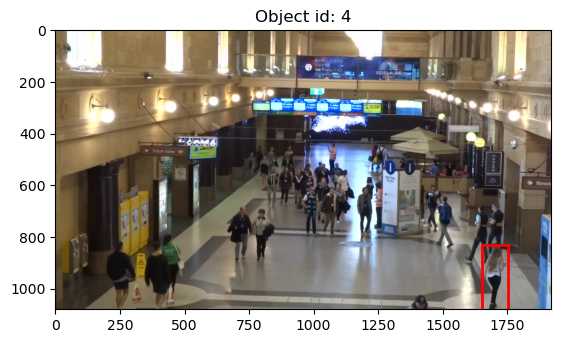

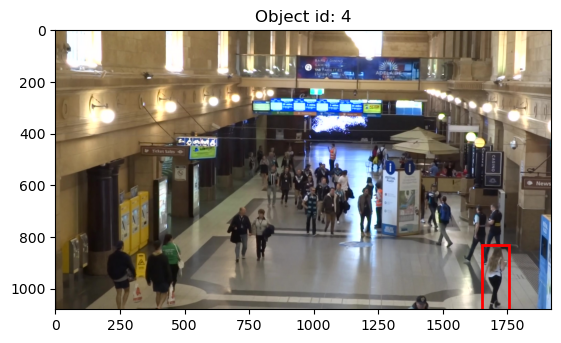

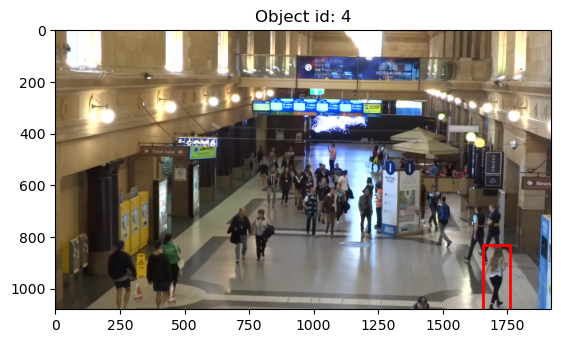

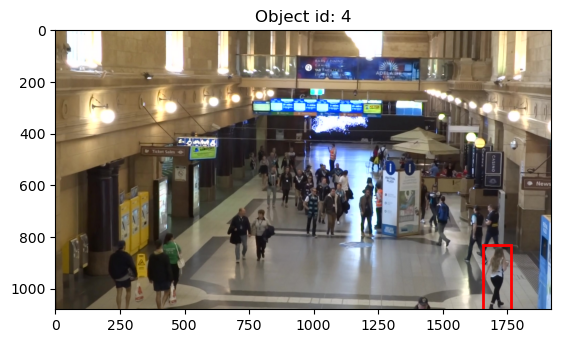

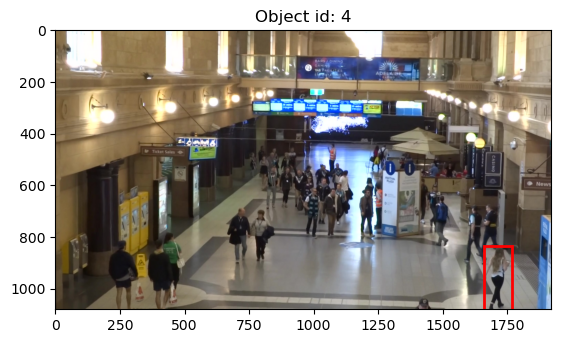

...

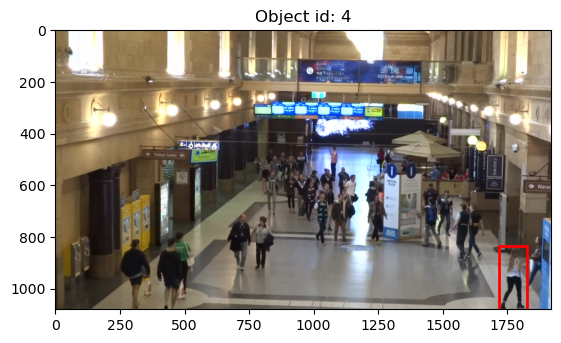

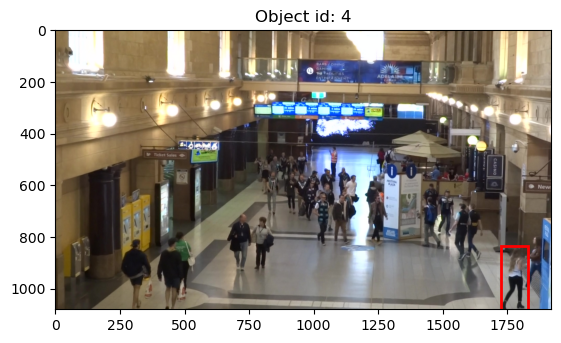

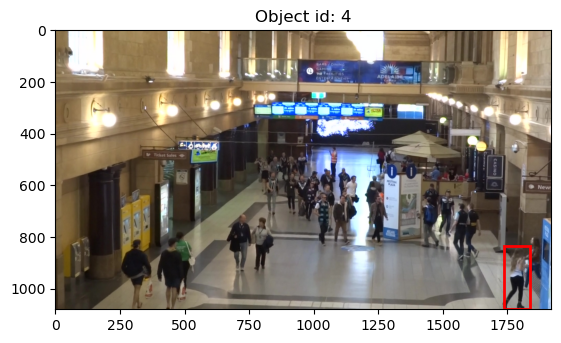

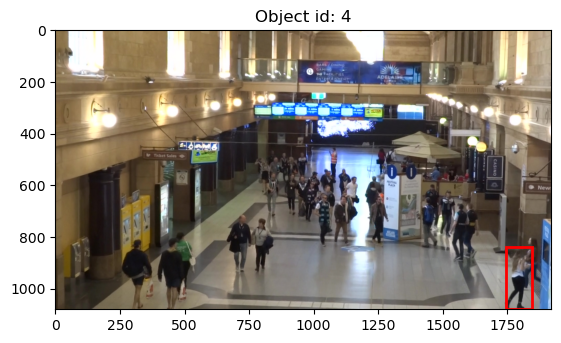

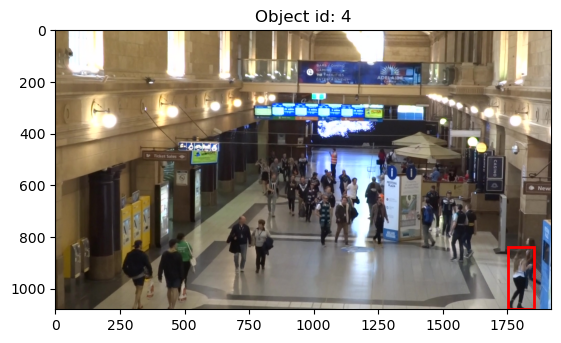

KeyboardInterrupt: 

In [7]:
def draw_all_bb_by_id(id):
    for _, line in extract_object_data_by_id(id).iterrows():
        image = Image.open(get_image_path_by_frame_id(line['frame']))
        show_object_with_bb(image, line.values)

draw_all_bb_by_id(4)

## Выделяем пары снимков - один и тот же человек в двух разных по времени кадрах

In [9]:
annotations[annotations['class'] == 7]

,frame,id,bb_left,bb_top,bb_width,bb_height,flag?,class,conf
2438,1.0,9.0,1232.0,589.0,58.0,182.0,0.0,7.0,0.47458
2439,2.0,9.0,1232.0,590.0,58.0,182.0,0.0,7.0,0.42929
2440,3.0,9.0,1232.0,591.0,58.0,182.0,0.0,7.0,0.36890
2441,4.0,9.0,1232.0,592.0,58.0,182.0,0.0,7.0,0.34056
2442,5.0,9.0,1233.0,593.0,58.0,182.0,0.0,7.0,0.27832
...,...,...,...,...,...,...,...,...,...
24584,425.0,85.0,1108.0,445.0,49.0,119.0,0.0,7.0,0.81433
24585,426.0,85.0,1109.0,446.0,49.0,119.0,0.0,7.0,0.80867
24586,427.0,85.0,1109.0,446.0,49.0,119.0,0.0,7.0,0.80550
24587,428.0,85.0,1110.0,446.0,49.0,119.0,0.0,7.0,0.80833


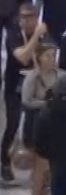

In [10]:
persons_annotations = annotations[annotations['class'] == 1]
random_object = persons_annotations.iloc[randint(1, len(persons_annotations))]

def crop(object, padding=0):
    x, y, w, h = object[2:6]
    img = Image.open(get_image_path_by_frame_id(object[0]))
    return img.crop(box=(x - padding, y - padding, x + w + padding, y + h + padding))

crop(random_object)

In [11]:
# annotations[annotations['class'] == ]
# annotations['class'].unique()

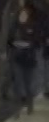

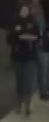

In [12]:
def get_random_person_image_tuple(annotations):
    random_object = annotations.iloc[randint(1, len(annotations))]
    current_person_annotations = annotations[annotations['id']
                                             == random_object['id']]
    current_person_annotations_next = current_person_annotations[current_person_annotations['frame'] > random_object['frame']]
    random_object_next = current_person_annotations_next.iloc[randint(1, len(current_person_annotations_next))]
    return random_object, random_object_next
prev, next = get_random_person_image_tuple(persons_annotations)
display(crop(prev))
display(crop(next))

In [13]:
# !find -depth 5 data/MOT20 -type d > dirs.txt
# !xargs mkdir -p < dirs.txt


# Преобразуем датасет к парам снимков

In [14]:
annotations['id'].unique()

array([ 1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10., 11., 12., 13.,
       14., 15., 16., 17., 18., 19., 20., 21., 22., 23., 24., 25., 26.,
       27., 28., 29., 30., 31., 32., 33., 34., 35., 36., 37., 38., 39.,
       40., 41., 42., 43., 44., 45., 46., 47., 48., 49., 50., 51., 52.,
       53., 54., 55., 56., 57., 58., 59., 60., 61., 62., 63., 64., 65.,
       66., 67., 68., 69., 70., 71., 72., 73., 74., 75., 76., 77., 78.,
       79., 80., 81., 82., 83., 84., 85., 86., 87., 88., 89., 90.])

In [15]:
def convert_dataset_to_tupled(dataset_path_prefix):
    ann = get_data_annotations(dataset_path_prefix)
    persons_annotations = ann[ann['class'] == 1]
    for object_id in persons_annotations['id'].unique():
        current_person_ann = persons_annotations[persons_annotations['id'] == object_id]
        f = IntProgress(min=0, max=len(current_person_ann) * len(current_person_ann))  # instantiate the bar
        display(f)  # display the bar
        print(len(current_person_ann))
        for i in range(1, len(current_person_ann)):
            for j in range(i, len(current_person_ann)):
                f.value += 1
                crop(current_person_ann.iloc[i])
                crop(current_person_ann.iloc[j])
        

convert_dataset_to_tupled(MOT2001_TRAIN_PATH)

IntProgress(value=0, max=114244)

338


KeyboardInterrupt: 

## Вычисление среднего значения разрешения и скейлинг изображений

In [20]:
shuffled = shuffle(annotations[annotations['class'] == 1])
ASPECT_RATIO = sum(shuffled['bb_width'] / shuffled['bb_height']) / len(shuffled)
ASPECT_RATIO

0.4403536584531342

In [24]:
def get_bb_with_aspect_ratio(object, ar):
    x, y, w, h = object[2:6]
    actual_ar = w / h
    w1, h1 = w, h
    padding = padding1 = 0
    if (actual_ar > ar):
        h1 = int(w / ar)
        padding = padding1 = (h1 - h) / 2
    else:
        w1 = int(ar * h)
        padding = padding1 = (w1 - w) / 2
    if (padding % 2 == 1):
        padding1 = round(padding)
    if (actual_ar > ar):
        return (x, y - padding1, w1, h1)
    else:
        return (x - padding1, y, w1, h1)

    # img = Image.open(get_image_path_by_frame_id(object[0]))
    # return img.crop(box=(x - padding, y - padding, x + w + padding, y + h + padding))
random_object = persons_annotations.iloc[randint(1, len(persons_annotations))]
print(random_object['bb_width'] / random_object['bb_height'])
x, y, w, h = get_bb_with_aspect_ratio(
    random_object,
    ASPECT_RATIO
    )
# print(random_object)
# x, y, w, h
w / h

0.48044692737430167


0.441025641025641

In [25]:
def scale_all_bb(ann):
    new_ann = ann.copy()
    for i, row in new_ann.iterrows():
        x, y, w, h = get_bb_with_aspect_ratio(row, ASPECT_RATIO)
        new_ann.iloc[i]['bb_left'] = x
        new_ann.iloc[i]['bb_top'] = y
        new_ann.iloc[i]['bb_width'] = w
        new_ann.iloc[i]['bb_height'] = h
    
    return new_ann

n_annotations = scale_all_bb(annotations)

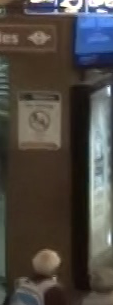

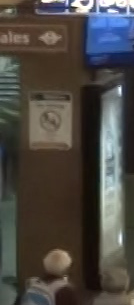

134.0


305.0

In [29]:
i = randint(1, len(annotations))
random_object = annotations.iloc[i]
random_object2 = n_annotations.iloc[i]
display(crop(random_object))
display(crop(random_object2))
print(random_object2['bb_width'])
random_object2['bb_height']